In [1]:
%cd "~/lab/NB10422645"
import torch
print("CUDA is: ",torch.cuda.is_available())
from src.surrogate.meta_models import SupportVectorRegression as svr
from src.surrogate.meta_models import FeedForwardNNRegression as ffn
from src.surrogate.test import TestFunctionSet2DInputSpace as F2D
from src.surrogate.test import TestFunctionSetNDInputSpace as FND
from src.surrogate.sampling import halton
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler
from src.surrogate.algorithms import SSIFL
scaler = MinMaxScaler()
F2D = F2D()
FND = FND(3)

/home/ggarrett/lab/NB10422645
CUDA is:  False


/home/ggarrett/anaconda3/envs/sigh/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [2]:
test_x = halton(F2D[0].norm_bounds, 10000)
test_dataset = (test_x, F2D[0](*test_x.T))

## Dataset sizes [1,2,3,4,5]

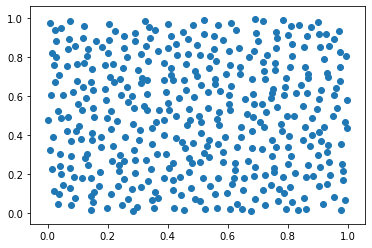

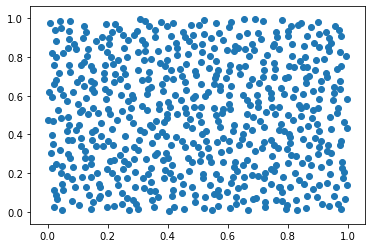

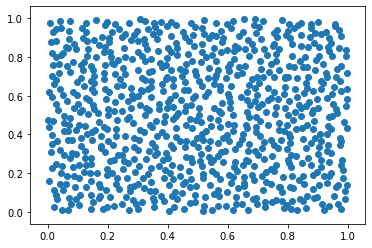

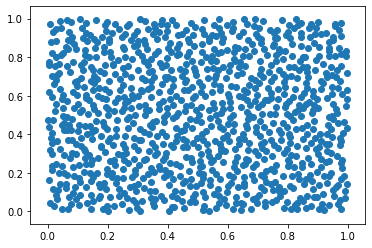

In [4]:
from src.surrogate.sampling import cvt

grid_number_samples = [200, 400, 600, 800, 1000]

# plt.scatter(*grid_datasets[0].T)
# plt.show()
grid_datasets= []

for i in range(1,5):
    grid_datasets.append(
    cvt(xdim=2,
        gdim=grid_number_samples[i],
        sample_num=int(1e3),
        iterations=10,
        seed=1))
    plt.scatter(*grid_datasets[-1].T)
    plt.show()


## Evaluations

In [7]:
grid_f_data = []
grid_x_data = grid_datasets

for ds in grid_datasets:
    grid_f_data.append(F2D[1](*ds.T))

grid_dataset = list(zip(grid_x_data, grid_f_data))

## Other

In [22]:
grid_number_layers =        [        1       2,            3,      4,       5]
grid_number_hidden =        [      100,    200,          300,    400,     500]
grid_activation_functions = ["sigmoid", "relu", "leaky_relu", "relu6", "tanh"]
grid_dropout_rate =         [        0,   5e-4,         5e-3,    5e-2,   5e-1]
grid_batch_size =           [     1e-2,   2e-2,         3e-2,    4e-2,   5e-2]

In [ ]:
# Signature:
# cvt(
#     xdim,
#     gdim,
#     initialize=<function halton at 0x7f781c107c80>,
#     sample=<function random_uniform at 0x7f781c107d90>,
#     sample_num=1000,
#     iterations=5,
#     seed=None,
#     form='sx',
#     **kwargs,
# )
# Docstring:
# :param xdim:
# :param gdim:
# :param initialize:
# :param sample:
# :param sample_num:
# :param iterations:
# :param seed:
# :param form:
# :return:
# File:      ~/lab/NB10422645/src/surrogate/sampling/_core.py
# Type:      function

## SVR

In [8]:
from src.surrogate.meta_models import SupportVectorRegression as svr


In [10]:
grid_gamma =     [50,  100,    200,   400,  800,   1000]
grid_epsilon =   [1e-3,  5e-3, 1e-2, 5e-2, 1e-1,   5e-1]
grid_shrinking = [True, False                          ]
grid_C =         [ 0.1,   0.5,  1.0,  1.5,  2.0        ] 
 
import numpy as np

grid_svr_idx = np.meshgrid(
    np.arange(len(grid_dataset)),
    np.arange(len(grid_gamma)),
    np.arange(len(grid_epsilon)),
    np.arange(len(grid_shrinking)),
    np.arange(len(grid_C)))

# grid_svr_idx2 = np.meshgrid(
#     np.arange(len(grid_dataset)),
#     np.arange(len(grid_gamma)),
#     np.arange(len(grid_epsilon)),
#     np.arange(len(grid_shrinking)),
#     np.arange(len(grid_C)), indexing="ij")

# print(grid_svr_idx1[1].shape)
# print(grid_svr_idx2[1].shape)

In [11]:
from sklearn.svm import SVR as sklearnSVR
from copy import deepcopy
def svr_eval(
    dataset_idx,
    gamma_idx, 
    epsilon_idx, 
    shrinking_idx,
    C_idx):
    model = sklearnSVR(**{
        "verbose":False,
        "kernel":"rbf",
        "gamma":grid_gamma[gamma_idx],
        "epsilon":grid_epsilon[epsilon_idx],
        "shrinking":grid_shrinking[shrinking_idx],
        "C":grid_C[C_idx]})
    model.fit(*grid_dataset[dataset_idx])
    score = model.score(*test_dataset)
    return deepcopy(model), score


In [13]:
vec_svr_eval = np.vectorize(svr_eval)

In [14]:
models_svr, score_svr = vec_svr_eval(*grid_svr_idx)


In [15]:
joblib.dump(models_svr, "models/grid_analysis_SVR_F2D_0_array.sv")
joblib.dump(score_svr, "models/grid_analysis_SVR_F2D_0_score.sv")

NameError: name 'joblib' is not defined

In [ ]:
t = vec_svr_eval(*test)

In [ ]:
import joblib
# size(t)


In [ ]:
import joblib

ci = joblib.load("notebooks/test.sv")

print(ci)

In [25]:
import plotly.graph_objects as go
import numpy as np

# fig.update_layout(title='Mt Bruno Elevation', autosize=False,
#                   width=500, height=500,
#                   margin=dict(l=65, r=50, b=65, t=90))

# fig.show()

# Create figure
fig = go.Figure()

x = np.linspace(0,1,50)
y = np.linspace(0,1,50)
XX, YY = np.meshgrid(x,y, indexing="xy")   
    
def svr_model_eval(
    gamma_idx,
    
    ):
    dataset_idx=2
    epsilon_idx=-4, 
    shrinking_idx=0,
    C_idx=0
    def vec__(x,y):
        return models_svr[
               gamma_idx,
               dataset_idx,
               epsilon_idx,
               shrinking_idx,
               C_idx][0].predict([[x,y]])[0]
    return np.vectorize(vec__)

# print(svr_model_eval(0)(XX,YY))
# Add traces, one for each slider step

for step in np.arange(len(grid_gamma)):
    fig.add_trace(
        go.Surface(
            visible=False,
#             line=dict(color="#00CED1", width=6),
#             name="𝜈 = " + str(step),
            x=x,
            y=y,
            z=svr_model_eval(step)(XX,YY)))

# Make 10th trace visible
fig.data[1].visible = True

# Create and add slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method="restyle",
        args=["visible", [False] * len(fig.data)],
    )
    step["args"][1][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=1,
    currentvalue={"prefix": "Frequency: "},
    pad={"t": 6},
    steps=steps
)]

fig.update_layout(
    sliders=sliders,
    scene_aspectmode='cube'
)

#     fig.update_layout()

fig.show()

In [27]:
%cd ~/lab/NB10422645/
import skopt
from src.surrogate.sampling import halton
from src.surrogate.sampling import random_uniform
from src.utils import TQDMSkoptCallable

from src.surrogate.test import TestFunctionSet2DInputSpace as F2D
from src.surrogate.test import TestFunctionSetNDInputSpace as FND
from sklearn.svm import SVR as sklearnSVR

F2D=F2D()
F3D=FND(3)
F4D=FND(4)
F4D=FND(5)
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

/home/ggarrett/lab/NB10422645


In [34]:
SPACE = [skopt.space.Real(1e-4, 1e3, name='gamma'),
        skopt.space.Real(1e-2, 1e-1, name='epsilon'),
     ]

import joblib


def do_and_save(minimizer, N, dim, scaler, STATIC_PARAMS):
    F = FND(dim)
    n_dim = dim
    Fset = F
    x = halton([[0]*n_dim,[1]*n_dim], N)
    x_v = random_uniform([[0]*n_dim,[1]*n_dim], int(N*2), seed=1)
    f = Fset[0](*x.T)
    f = scaler.fit_transform(f.reshape(-1,1)).flatten()
    f_v = scaler.transform(Fset[0](*x_v.T).reshape(-1,1)).flatten()
    @skopt.utils.use_named_args(SPACE)
    def objective(**params):
        all_params = {**params, **STATIC_PARAMS}
        dataset_train = (x, f.flatten())
        dataset_test = (x_v, f_v.flatten())
        all_params.pop("n_calls")
        model = sklearnSVR(**all_params)
        model.fit(x,f)
        return - model.score(x_v, f_v)
    STATIC_PARAMS_2 = {}
    STATIC_PARAMS_2["n_calls"] = 50
    progress = TQDMSkoptCallable(total=STATIC_PARAMS["n_calls"], desc="Model HpOpt",
                                 leave=False)
    result=minimizer(objective, SPACE, callback=[progress], **STATIC_PARAMS)
    name = f"Min: {str(minimizer.__name__)} N:{N} | dim: {dim}"
    return result, name

    
STATIC_PARAMS = {}
scaler1 = MinMaxScaler()
STATIC_PARAMS["n_calls"] = 50
r1 = do_and_save(skopt.gp_minimize,4000,4, scaler1, STATIC_PARAMS)


/home/ggarrett/anaconda3/envs/sigh/lib/python3.7/site-packages/skopt/optimizer/optimizer.py:399: UserWarning:

The objective has been evaluated at this point before.

/home/ggarrett/anaconda3/envs/sigh/lib/python3.7/site-packages/skopt/optimizer/optimizer.py:399: UserWarning:

The objective has been evaluated at this point before.

/home/ggarrett/anaconda3/envs/sigh/lib/python3.7/site-packages/skopt/optimizer/optimizer.py:399: UserWarning:

The objective has been evaluated at this point before.

/home/ggarrett/anaconda3/envs/sigh/lib/python3.7/site-packages/skopt/optimizer/optimizer.py:399: UserWarning:

The objective has been evaluated at this point before.

/home/ggarrett/anaconda3/envs/sigh/lib/python3.7/site-packages/skopt/optimizer/optimizer.py:399: UserWarning:

The objective has been evaluated at this point before.

/home/ggarrett/anaconda3/envs/sigh/lib/python3.7/site-packages/skopt/optimizer/optimizer.py:399: UserWarning:

The objective has been evaluated at this point before.

In [36]:
import numpy as np


import skopt.plots
from skopt.plots import _format_scatter_plot_axes
from skopt.plots import MaxNLocator

def plot_evaluations(result, bins=20, dimensions=None,fig_scale=1, **kwargs):
    """Visualize the order in which points where sampled.

    The scatter plot matrix shows at which points in the search
    space and in which order samples were evaluated. Pairwise
    scatter plots are shown on the off-diagonal for each
    dimension of the search space. The order in which samples
    were evaluated is encoded in each point's color.
    The diagonal shows a histogram of sampled values for each
    dimension. A red point indicates the found minimum.

    Note: search spaces that contain `Categorical` dimensions are
          currently not supported by this function.

    Parameters
    ----------
    * `result` [`OptimizeResult`]
        The result for which to create the scatter plot matrix.

    * `bins` [int, bins=20]:
        Number of bins to use for histograms on the diagonal.

    * `dimensions` [list of str, default=None] Labels of the dimension
        variables. `None` defaults to `space.dimensions[i].name`, or
        if also `None` to `['X_0', 'X_1', ..]`.

    Returns
    -------
    * `ax`: [`Axes`]:
        The matplotlib axes.
    """
    space = result.space
    samples = np.asarray(result.x_iters)
    order = range(samples.shape[0])
    fig, ax = plt.subplots(space.n_dims, space.n_dims,
                           figsize=(2 * space.n_dims*fig_scale, 2 * space.n_dims*fig_scale), **kwargs)

    fig.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=0.95,
                        hspace=0.1, wspace=0.1)

    for i in range(space.n_dims):
        for j in range(space.n_dims):
            if i == j:
                if space.dimensions[j].prior == 'log-uniform':
                    low, high = space.bounds[j]
                    bins_ = np.logspace(np.log10(low), np.log10(high), bins)
                else:
                    bins_ = bins
                ax[i, i].hist(samples[:, j], bins=bins_,
                              range=space.dimensions[j].bounds)

            # lower triangle
            elif i > j:
                ax[i, j].scatter(samples[:, j], samples[:, i], c=order,
                                 s=40, lw=0., cmap='viridis')
                ax[i, j].scatter(result.x[j], result.x[i],
                                 c=['r'], s=20, lw=0.)

    return _format_scatter_plot_axes(ax, space, ylabel="Number of samples",
                                     dim_labels=dimensions)

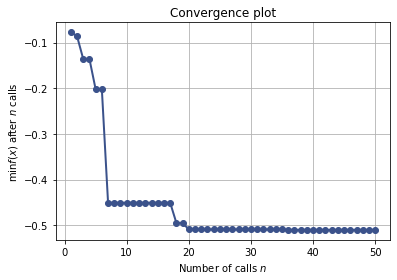

<Figure size 2400x1600 with 0 Axes>

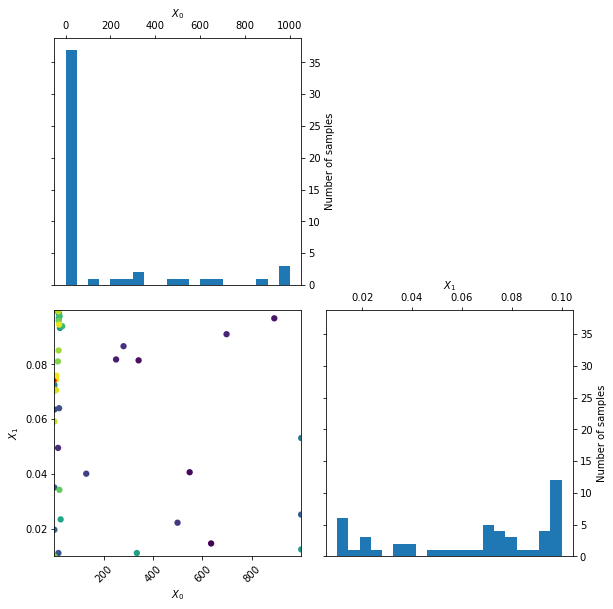

In [37]:
r1_, name=r1
# plt.figure(dpi=400, figsize=(6,4))
skopt.plots.plot_convergence(r1_)
plt.show()

plt.figure(dpi=400, figsize=(6,4))
plot_evaluations(r1_, fig_scale=2)
plt.show()

In [2]:
import skopt.plots
import matplotlib.pyplot as plt

skopt.plots.plot_convergence(result_bayesian)
skopt.plots.plot_evaluations(result_bayesian)

NameError: name 'result_bayesian' is not defined

<Figure size 1600x1600 with 0 Axes>

In [194]:
from sklearn.datasets import make_friedman2
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import DotProduct, WhiteKernel
# X, y = make_friedman2(n_samples=500, noise=0, random_state=0)
# kernel = DotProduct() + WhiteKernel()
# gpr = GaussianProcessRegressor(kernel=kernel,
# ...         random_state=0).fit(X, y)
# >>> gpr.score(X, y) 
# 0.3680...
# >>> gpr.predict(X[:2,:], return_std=True) 
# (array([653.0..., 592.1...]), array([316.6..

import numpy as np
from src.surrogate.sampling import uniform_grid
from src.surrogate.sampling.util import plotly3Dsurf, plotly3Dtrisurf
    
def compare(n, model, scaler):
    bounds = np.array([[0]*n,[1]*n])
    X = uniform_grid(bounds, 150, flatten=False)
    X_ = uniform_grid(bounds, 150, flatten=True)
    def vec_eval(*x):
        return model.predict([[*x, 0.5]])[0]
    F=np.vectorize(vec_eval)(*X)
    if scaler:
        plotly3Dsurf(X[0], X[1], scaler.inverse_transform(F.reshape(-1,1)).reshape(150,150))
    else:
        plotly3Dsurf(X[0], X[1], F.reshape(150,150))

def compare1(n, model, scaler):
    bounds = np.array([[0]*n,[1]*n])
    X = uniform_grid(bounds, 150, flatten=False)
    X_ = uniform_grid(bounds, 150, flatten=True)
    print(X_.shape)
#     def vec_eval(x):
#         return model.predict(x)
    F=model.predict(X_)
    if scaler:
        plotly3Dsurf(X[0], X[1], scaler.inverse_transform(F.reshape(-1,1)).reshape(150,150))
    else:
        plotly3Dsurf(X[0], X[1], F.reshape(150,150))

from sklearn.preprocessing import MinMaxScaler
scaler1 = MinMaxScaler(feature_range=(0,1))
x = halton([[0]*2,[1]*2], 500)
x2 = halton([[0]*2,[1]*2], 100)

print(x.shape)

f = F2D[0](*x.T)
f2 = F2D[0](*x2.T)

print(f.shape)
# print(f)
model = sklearnSVR(gamma=500)
model = model.fit(x,scaler1.fit_transform(f.reshape(-1,1)).flatten())
model2 = sklearnSVR(gamma=500)
model2.fit(x2, np.abs(f2-
                     scaler1.inverse_transform(model.predict(x2).reshape(-1,1)).flatten()
                    ))

# model3 = GaussianProcessRegressor()
# model3.fit(x, f-model2.predict(x)-model.predict(x))

# print(model)
# print(model.predict(f.reshape(-1,1)))

(500, 2)
(500,)


SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=500,
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [195]:
compare1(2, model, scaler1)

# result=skopt.gp_minimize(objective, SPACE, callback=[progress], **STATIC_PARAMS)

(22500, 2)


In [196]:
compare1(2, model2, None)

compare1(2, model3, None)



(22500, 2)


(22500, 2)


In [129]:
class combined_model:
    
    def __init__(self, model1, model2):
        self.model1=model1
        self.model2=model2
    
    def predict(self,x):
        return self.model1.predict(x) + self.model2.predict(x)*10

In [130]:
t = combined_model(model, model2)

compare1(2, t, scaler1)

(22500, 2)
